<a id='begin'></a>
# <p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;"> Coronavirus Visualization and Analysis 📊 </p>

![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQ1dgHLgZ4BY-Ybql-Z9BfOLDD0VMGMRwugyA&usqp=CAU)

In [1]:
#Necessary Libraries

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots



import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



<a id='loaddata'></a>
# <p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">Loading data 📂 </p>

In [2]:
#Loading Dataset

dfd = pd.read_csv(r"C:\Users\LENOVO\Documents\covid-19\worldometer_coronavirus_daily_data.csv")
dfd.head(10)

,date,country,cumulative_total_cases,daily_new_cases,active_cases,cumulative_total_deaths,daily_new_deaths
0,2020-2-15,Afghanistan,0.0,NaN,0.0,0.0,NaN
1,2020-2-16,Afghanistan,0.0,NaN,0.0,0.0,NaN
2,2020-2-17,Afghanistan,0.0,NaN,0.0,0.0,NaN
3,2020-2-18,Afghanistan,0.0,NaN,0.0,0.0,NaN
4,2020-2-19,Afghanistan,0.0,NaN,0.0,0.0,NaN
5,2020-2-20,Afghanistan,0.0,NaN,0.0,0.0,NaN
6,2020-2-21,Afghanistan,0.0,NaN,0.0,0.0,NaN
7,2020-2-22,Afghanistan,0.0,NaN,0.0,0.0,NaN
8,2020-2-23,Afghanistan,0.0,NaN,0.0,0.0,NaN
9,2020-2-24,Afghanistan,1.0,NaN,1.0,0.0,NaN


In [3]:
#Loading Dataset

dfs = pd.read_csv(r"C:\Users\LENOVO\Documents\covid-19\worldometer_coronavirus_summary_data.csv")
dfs.head(10)

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population
0,Afghanistan,Asia,55995,2460.0,49481.0,4054.0,1095.0,1416,62.0,322332.0,8152.0,39540117
1,Albania,Europe,118017,2060.0,81061.0,34896.0,46.0,41041,716.0,509677.0,177243.0,2875580
2,Algeria,Africa,115410,3040.0,79994.0,32376.0,14.0,2599,68.0,NaN,NaN,44404834
3,Andorra,Europe,11289,113.0,10795.0,381.0,12.0,145943,1461.0,193595.0,2502780.0,77352
4,Angola,Africa,21407,521.0,19948.0,938.0,14.0,638,16.0,406827.0,12116.0,33576529
5,Anguilla,North America,21,NaN,18.0,3.0,NaN,1391,NaN,11052.0,732066.0,15097
6,Antigua And Barbuda,North America,963,27.0,598.0,338.0,45.0,9777,274.0,16075.0,163200.0,98499
7,Argentina,South America,2201886,53836.0,1993215.0,154835.0,3469.0,48407,1184.0,8032713.0,176593.0,45487062
8,Armenia,Asia,179287,3277.0,166702.0,9308.0,NaN,60424,1104.0,780085.0,262908.0,2967146
9,Aruba,North America,8421,79.0,8074.0,268.0,8.0,78638,738.0,114033.0,1064883.0,107085


In [4]:
print(dfd.shape)
print(dfs.shape)

(86529, 7)
(219, 12)


In [5]:
#Creating a column named mortality rate

dfs["mortality_rate"] = dfs["total_deaths"]/dfs["population"]*100
dfs

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population,mortality_rate
0,Afghanistan,Asia,55995,2460.0,49481.0,4054.0,1095.0,1416,62.0,322332.0,8152.0,39540117,0.006222
1,Albania,Europe,118017,2060.0,81061.0,34896.0,46.0,41041,716.0,509677.0,177243.0,2875580,0.071638
2,Algeria,Africa,115410,3040.0,79994.0,32376.0,14.0,2599,68.0,NaN,NaN,44404834,0.006846
3,Andorra,Europe,11289,113.0,10795.0,381.0,12.0,145943,1461.0,193595.0,2502780.0,77352,0.146085
4,Angola,Africa,21407,521.0,19948.0,938.0,14.0,638,16.0,406827.0,12116.0,33576529,0.001552
...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,Wallis And Futuna Islands,Australia/Oceania,233,NaN,7.0,226.0,1.0,20993,NaN,1331.0,119921.0,11099,NaN
215,Western Sahara,Africa,10,1.0,8.0,1.0,NaN,16,2.0,NaN,NaN,607576,0.000165
216,Yemen,Asia,2908,698.0,1500.0,710.0,23.0,96,23.0,17404.0,575.0,30284463,0.002305
217,Zambia,Africa,84950,1164.0,82375.0,1411.0,149.0,4533,62.0,1165041.0,62161.0,18742215,0.006211


**Mortality Rate**

Mortality rate, or death rate, is a measure of the number of deaths (in general, or due to a specific cause) in a particular population, scaled to the size of that population, per unit of time.

In [6]:
#Creating a column named fatality rate

dfs["fatality_rate"] = dfs["total_deaths"]/dfs["total_confirmed"]*100
dfs

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population,mortality_rate,fatality_rate
0,Afghanistan,Asia,55995,2460.0,49481.0,4054.0,1095.0,1416,62.0,322332.0,8152.0,39540117,0.006222,4.393249
1,Albania,Europe,118017,2060.0,81061.0,34896.0,46.0,41041,716.0,509677.0,177243.0,2875580,0.071638,1.745511
2,Algeria,Africa,115410,3040.0,79994.0,32376.0,14.0,2599,68.0,NaN,NaN,44404834,0.006846,2.634087
3,Andorra,Europe,11289,113.0,10795.0,381.0,12.0,145943,1461.0,193595.0,2502780.0,77352,0.146085,1.000974
4,Angola,Africa,21407,521.0,19948.0,938.0,14.0,638,16.0,406827.0,12116.0,33576529,0.001552,2.433783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,Wallis And Futuna Islands,Australia/Oceania,233,NaN,7.0,226.0,1.0,20993,NaN,1331.0,119921.0,11099,NaN,NaN
215,Western Sahara,Africa,10,1.0,8.0,1.0,NaN,16,2.0,NaN,NaN,607576,0.000165,10.000000
216,Yemen,Asia,2908,698.0,1500.0,710.0,23.0,96,23.0,17404.0,575.0,30284463,0.002305,24.002751
217,Zambia,Africa,84950,1164.0,82375.0,1411.0,149.0,4533,62.0,1165041.0,62161.0,18742215,0.006211,1.370218


**Fatality Rate**

In epidemiology, a case fatality risk or case-fatality ratio – is the proportion of deaths from a certain disease compared to the total number of people diagnosed with the disease for a particular period. A CFR is conventionally expressed as a percentage and represents a measure of disease severity.

<p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">1.Mortality Rate by Countries </p>

In [7]:
fig = px.bar(dfs, x="country", y="mortality_rate", title="Mortality Rate by Countries",color ="continent")
fig.update_layout( xaxis={'categoryorder':'total descending'})
fig.show()


<p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">2.Fatality Rate by Countries </p>

In [8]:
fig1 = px.bar(dfs, x="country", y="fatality_rate", title="Fatality Rate by Countries",color="continent")
fig1.update_layout( xaxis={'categoryorder':'total descending'})


# <p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">3.Wolrdwide Coronavirus Cases 🗺️ </p>

In [9]:
def choropleth(Stats,ColorbarTitle,GraphTitle):

    fig = go.Figure(data=go.Choropleth(
        locations = dfs['country'],
        locationmode='country names',
        z = Stats,
        text = dfs['country'],
        colorscale = 'reds',
        autocolorscale=False,
        reversescale=False,
        marker_line_color='darkgray',
        marker_line_width=0.5,
        colorbar_title = ColorbarTitle,
        ))

    fig.update_layout(
        title_text= GraphTitle,
        geo=dict(
            showframe=False,
            showcoastlines=True,
            projection_type='equirectangular'
        ),
   
    )

    return fig

In [10]:
choropleth(dfs["total_confirmed"],"Confirmed Cases","Coronavirus Confirmed Cases by Countries")

In [11]:
choropleth(dfs["total_deaths"],"Deaths","Coronavirus Total Deaths by Countries")

In [12]:
choropleth(dfs["total_recovered"],"Recovered Cases","Coronavirus Recovered Cases")

In [13]:
choropleth(dfs["active_cases"],"Active Cases","Coronavirus Active Cases")

# <p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">4.Coronavirus Cases by Continents 🌏 🌎 🌍 </p>

In [14]:
cts = dfs.groupby("continent",as_index=False)[["total_confirmed","total_deaths","total_recovered","active_cases","serious_or_critical"]].sum()
cts.head(6)


,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical
0,Africa,4075097,108298.0,3645966.0,320833.0,2598.0
1,Asia,26273290,410922.0,24572495.0,1289873.0,22980.0
2,Australia/Oceania,52805,1104.0,34379.0,17322.0,4.0
3,Europe,36427488,860161.0,25816251.0,7905121.0,27664.0
4,North America,34639364,792886.0,26028390.0,7818088.0,15757.0
5,South America,19346806,499992.0,17327933.0,1518881.0,19292.0


In [15]:
africa = cts[cts["continent"]=="Africa"]
asia = cts[cts["continent"]=="Asia"]
ao = cts[cts["continent"]=="Australia/Oceania"]
eu = cts[cts["continent"]=="Europe"]
na = cts[cts["continent"]=="North America"]
sa = cts[cts["continent"]=="South America"]

In [16]:
def pie_chart(continent,text):
    trace = go.Pie(labels=['Total Confirmed','Total Deaths','Total Recovered', 'Total Active','Critical Cases'],
               values=[continent.total_confirmed.sum(),continent.total_deaths.sum(),continent.total_recovered.sum(), continent.active_cases.sum(),continent.serious_or_critical.sum()], 
               title_font_size=20,
               hovertemplate="<b>%{label}</b><br>%{value}<br><i>%{percent}</i>",
               textinfo='percent',
               textposition='inside',
               showlegend=True,
               name='',
               marker=dict(colors=["#ff5148", "#000201", "#61f7ff","#ffb861","#61ffb8"],
               line=dict(color='#000000', width=2)
               
                          )
              )
    fig=go.Figure(data=[trace])
    fig.update_layout(title_text=text)
    return fig

![](https://lh3.googleusercontent.com/proxy/W0hLwQ4oF0q8e69PGEiJ9GpD0L5HfNkeGw7FduHq4dPyLII5TIwgfnzvTx1ZPqSTQKyPn9Uhe_0YyhMHiSRZ_6QtblWHOJo8x0QBxIBw2J_ZJ58KCXza_K83vlzH58wbcxEGmg)

In [17]:
#CoronaVirus Cases in Africa
pie_chart(africa,"Coronavirus Cases in Africa")

In [18]:
pie_chart(asia,"Coronavirus Cases in Asia")

In [19]:
pie_chart(ao,"Coronavirus cases in Australia/Oceania")

In [20]:
pie_chart(eu,"Coronavirus Cases in Europe")

In [21]:
pie_chart(na,"Coronavirus Cases in North America")

In [22]:
pie_chart(sa,"Coronavirus Cases in South America")

# <p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">5.20 Countries Worst Affected by Coronavirus and Statistics ⚕️
 </p>

In [23]:

topdeath = dfs.sort_values(by="total_deaths" ,ascending=False)
topdeath.head(20)


,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population,mortality_rate,fatality_rate
209,USA,North America,30138586,548013.0,22286551.0,7304022.0,9286.0,90678,1649.0,381627499.0,1148208.0,332367957,0.164881,1.818310
26,Brazil,South America,11525477,279602.0,10111954.0,1133921.0,8318.0,53953,1309.0,28600000.0,133882.0,213621654,0.130887,2.425947
129,Mexico,North America,2167729,194944.0,1711931.0,260854.0,4798.0,16690,1501.0,5776241.0,44472.0,129883602,0.150091,8.993006
93,India,Asia,11409831,158892.0,11027543.0,223396.0,8944.0,8211,114.0,228280763.0,164286.0,1389530904,0.011435,1.392589
205,UK,Europe,4263527,125580.0,3526715.0,611232.0,1110.0,62573,1843.0,106046223.0,1556370.0,68136918,0.184305,2.945449
100,Italy,Europe,3238394,102499.0,2605538.0,530357.0,3157.0,53617,1697.0,44802319.0,741771.0,60399096,0.169703,3.165118
160,Russia,Europe,4409438,92937.0,4014220.0,302281.0,2300.0,30206,637.0,115700000.0,792582.0,145978580,0.063665,2.107684
71,France,Europe,4078133,90762.0,273771.0,3713600.0,4219.0,62380,1388.0,57688372.0,882419.0,65375268,0.138832,2.225577
77,Germany,Europe,2585385,74115.0,2374200.0,137070.0,2848.0,30788,883.0,46319641.0,551604.0,83972604,0.088261,2.866691
185,Spain,Europe,3195062,72424.0,2857714.0,264924.0,2112.0,68318,1549.0,41114319.0,879121.0,46767546,0.154860,2.266748


In [24]:
def graphstat(cname):

    fig1 = px.line(data_frame = dfd[dfd["country"]== cname], x="date", y="cumulative_total_cases",title = "Coronavirus Total Cases in USA")
    fig2 = px.line(data_frame = dfd[dfd["country"]== cname], x="date", y="daily_new_cases",title = "Coronavirus Total Cases in USA")
    fig3 = px.line(data_frame = dfd[dfd["country"]== cname], x="date", y="cumulative_total_deaths",title = "Coronavirus Total Cases in USA")
    fig4 = px.line(data_frame = dfd[dfd["country"]== cname], x="date", y="daily_new_deaths",title = "Coronavirus Total Cases in USA")

    trace1 = fig1['data'][0]
    trace2 = fig2['data'][0]
    trace3 = fig3['data'][0]
    trace4 = fig4['data'][0]

    fig = make_subplots(rows=4, cols=1, shared_xaxes=False,subplot_titles=('Coronavirus Total Cases in '+ str(cname),'Coronavirus Daily Cases in '+str(cname),'Coronavirus Total Deaths in '+str(cname),'Coronavirus Daily Deaths in '+str(cname)))
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)
    fig.add_trace(trace3, row=3, col=1)
    fig.add_trace(trace4, row=4, col=1)
    
    fig.update_xaxes(title_text="Date", row=1, col=1)
    fig.update_xaxes(title_text="Date", row=2, col=1)
    fig.update_xaxes(title_text="Date", row=3, col=1)
    fig.update_xaxes(title_text="Date", row=4, col=1)

    
    fig.update_yaxes(title_text="Number of People", row=1, col=1)
    fig.update_yaxes(title_text="Number of People", row=2, col=1)
    fig.update_yaxes(title_text="Number of People", row=3, col=1)
    fig.update_yaxes(title_text="Number of People", row=4, col=1)
    
    
    
    fig.update_layout(title_text="Coronavirus Statistics in "+str(cname), height=1500)
    
    
    
    return fig


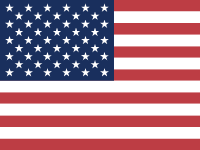

In [25]:
graphstat("USA")

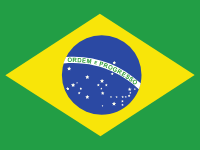

In [26]:
graphstat("Brazil")

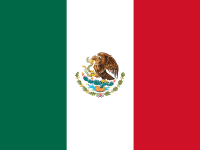

In [27]:
graphstat("Mexico")

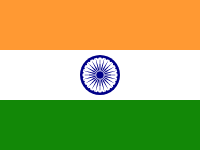

In [28]:
graphstat("India")

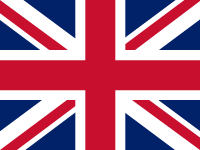

In [29]:
graphstat("UK")

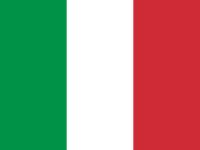

In [30]:
graphstat("Italy")

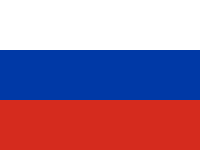

In [31]:
graphstat("Russia")

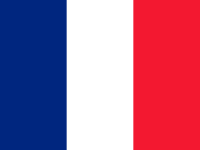

In [32]:
graphstat("France")

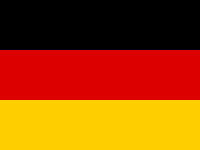

In [33]:
graphstat("Germany")

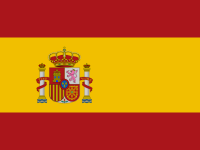

In [34]:
graphstat("Spain")

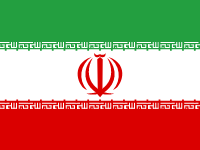

In [35]:
graphstat("Iran")

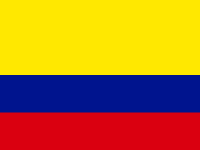

In [36]:
graphstat("Colombia")

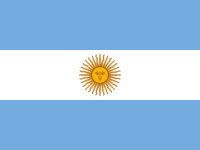

In [37]:
graphstat("Argentina")

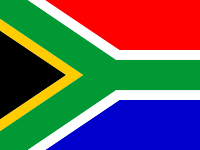

In [38]:
graphstat("South Africa")

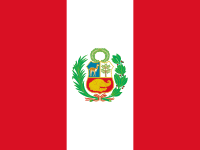

In [39]:
graphstat("Peru")

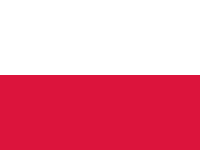

In [40]:
graphstat("Poland")

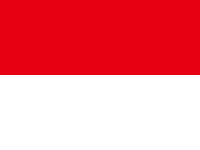

In [41]:
graphstat("Indonesia")

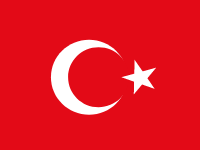

In [42]:
graphstat("Turkey")

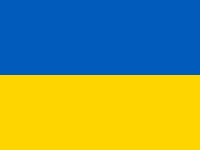

In [43]:
graphstat("Ukraine")

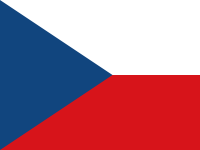

In [44]:
graphstat("Czech Republic")

# <p style="background-color:white; font-family:newtimeroman; font-size:150%; text-align:center; border-radius: 15px 50px;">6.20 Countries Bar Chart Race</p>

In [45]:
#Installing Bar chart race
#!pip install bar_chart_race
import bar_chart_race as bcr


In [46]:
#Preparing data format for bar chart race

dfd["date"] = dfd["date"].apply(pd.to_datetime)
t10countries = ["USA","Brazil","Mexico","India","UK","Italy","Russia","France","Germany","Spain","Iran","Colombia","Argentina","South Africa","Peru","Poland","Indonesia","Turkey","Ukraine","Czech Republic"]


In [47]:

t10c = dfd["country"].isin(t10countries)
top10country=dfd[t10c]
cases = top10country.pivot_table(index='date', columns='country', values='cumulative_total_cases')

cases


country,Argentina,Brazil,Colombia,Czech Republic,France,Germany,India,Indonesia,Iran,Italy,Mexico,Peru,Poland,Russia,South Africa,Spain,Turkey,UK,USA,Ukraine
date,,,,,,,,,,,,,,,,,,,,
2020-02-15,0.0,0.0,0.0,0.0,12.0,16.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,710.0,0.0,9.0,15.0,0.0
2020-02-16,0.0,0.0,0.0,0.0,12.0,16.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,736.0,0.0,9.0,15.0,0.0
2020-02-17,0.0,0.0,0.0,0.0,12.0,16.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,764.0,0.0,9.0,15.0,0.0
2020-02-18,0.0,0.0,0.0,0.0,12.0,16.0,3.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,792.0,0.0,9.0,15.0,0.0
2020-02-19,0.0,0.0,0.0,0.0,12.0,16.0,3.0,0.0,2.0,3.0,0.0,0.0,0.0,2.0,0.0,810.0,0.0,9.0,15.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11,2177898.0,11284269.0,2290539.0,1365999.0,3990331.0,2546510.0,11305979.0,1403722.0,1723470.0,3148983.0,2144558.0,1394571.0,1849522.0,4360823.0,1525648.0,3178356.0,2835989.0,4241677.0,29930865.0,1425522.0
2021-03-12,2185747.0,11368316.0,2294617.0,1377235.0,4015560.0,2559296.0,11333491.0,1410134.0,1731558.0,3175776.0,2151028.0,1402610.0,1868311.0,4370617.0,1526873.0,3183704.0,2850930.0,4248286.0,29999058.0,1438468.0
2021-03-13,2192025.0,11439250.0,2299082.0,1392189.0,4045319.0,2569850.0,11358644.0,1414741.0,1739360.0,3201827.0,2157771.0,1407963.0,1889373.0,4380525.0,1528414.0,3187486.0,2866012.0,4253820.0,30050957.0,1451744.0


In [48]:
bcr.bar_chart_race(cases,title='Coronavirus Total Cases',figsize=(3, 4),bar_label_size=5,tick_label_size=5)

c:\Users\LENOVO\miniconda3\lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\LENOVO\miniconda3\lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator



In [ ]:
cases2 = top10country.pivot_table(index='date', columns='country', values='cumulative_total_deaths')
cases2

country,Argentina,Brazil,Colombia,Czech Republic,France,Germany,India,Indonesia,Iran,Italy,Mexico,Peru,Poland,Russia,South Africa,Spain,Turkey,UK,USA,Ukraine
date,,,,,,,,,,,,,,,,,,,,
2020-02-15,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-16,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-17,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-18,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-19,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11,53493.0,273124.0,60858.0,22774.0,89892.0,73560.0,158326.0,38049.0,61016.0,101184.0,192488.0,48484.0,46373.0,90734.0,51110.0,72085.0,29290.0,125168.0,544043.0,27685.0
2021-03-12,53578.0,275276.0,60950.0,22991.0,90146.0,73790.0,158483.0,38229.0,61069.0,101564.0,193142.0,48664.0,46725.0,91220.0,51179.0,72258.0,29356.0,125343.0,545559.0,27915.0
2021-03-13,53646.0,277216.0,61046.0,23185.0,90315.0,73907.0,158642.0,38329.0,61142.0,101881.0,193851.0,48841.0,47068.0,91695.0,51261.0,72313.0,29421.0,125464.0,546597.0,28158.0


In [ ]:
bcr.bar_chart_race(cases2,title='Coronavirus Total Deaths',figsize=(3, 4),bar_label_size=5,tick_label_size=5)


c:\Users\LENOVO\miniconda3\lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\LENOVO\miniconda3\lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator

